# Yolov5 + LaMa Inpainting (complete version)
This block is for yolov5 object detection and LaMa inapainting

In [ ]:
#@title Settings for ppp
%cd /content/
!git clone https://github.com/darkenergy814/PPP.git

%cd /content/PPP/yolov5/
!pip install -r requirements.txt  # install yolov5 requirements

%cd /content/PPP
!pip install ultralytics

%cd /content/PPP/MaskGenerator/
!gdown https://drive.google.com/uc?id=1TKUotZmksKbZDwQckLBJXkcLsMkRiYmG

%cd /content/PPP/
print('\n> Install dependencies')
# !pip install torch==2.0.0 torchvision==0.9.0 torchaudio==0.8.0 torchtext==0.9
!pip install -r lama/requirements.txt --quiet
!pip install wget --quiet

!pip install torchdata==0.6.1
!pip install torchtext==0.15.2

# !pip install torch==1.8.0+cu111 torchvision==0.9.0+cu111 torchaudio==0.8.0 -f https://download.pytorch.org/whl/torch_stable.html --quiet
!pip install torch==2.0.0+cu118 torchvision==0.15.1+cu118 torchaudio==2.0.1 --index-url https://download.pytorch.org/whl/cu118

print('\n> Changing the dir to:')
%cd /content/PPP/lama

!pip install wldhx.yadisk-direct
print('\n> Download the model')
!curl -L $(yadisk-direct https://disk.yandex.ru/d/ouP6l8VJ0HpMZg) -o big-lama.zip
!unzip big-lama.zip

print('>fixing opencv')
!pip uninstall opencv-python-headless -y --quiet
!pip install opencv-python-headless==4.6.0.66 --quiet

!pip install lightning
!pip install kornia==0.5.0
!pip install hydra-core==1.1.0
!pip install webdataset
!pip install lightning

# make directory for lama prediction
%cd /content/PPP/lama/
!mkdir data_for_prediction

!cp -r '/content/PPP/MaskGenerator/example/sample1.png' '/content/PPP/lama/data_for_prediction'
!cp -r '/content/PPP/MaskGenerator/example/sample1_mask.png' '/content/PPP/lama/data_for_prediction'

/content
Cloning into 'PPP'...
remote: Enumerating objects: 423, done.
remote: Counting objects: 100% (298/298), done.
remote: Compressing objects: 100% (246/246), done.
remote: Total 423 (delta 44), reused 293 (delta 41), pack-reused 125
Receiving objects: 100% (423/423), 50.21 MiB | 14.33 MiB/s, done.
Resolving deltas: 100% (66/66), done.
/content/PPP/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 27.7 MB/s eta 0:00:00
/content/PPP
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 626.9/626.9 kB 32.2 MB/s eta 0:00:00
/content/PPP/MaskGenerator
Downloading...
From: https://drive.google.com/uc?id=1TKUotZmksKbZDwQckLBJXkcLsMkRiYmG
To: /content/PPP/MaskGenerator/yolov5m_MonitorDetectionHQ.pt
100% 42.1M/42.1M [00:00<00:00, 202MB/s]
/content/PPP

> Install dependencies
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.6/144.6 kB 19.1 MB/s eta 0:00:00
     ━━━━━━

/content/PPP


/usr/local/lib/python3.10/dist-packages/torch/hub.py:286: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-7-9 Python-3.10.12 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)



[Errno 2] No such file or directory: '/usr/local/lib/python3.10/dist-packages/torch-2.0.1+cu118.dist-info/METADATA'


Fusing layers... 
Model summary: 290 layers, 20856975 parameters, 0 gradients, 47.9 GFLOPs
Adding AutoShape... 


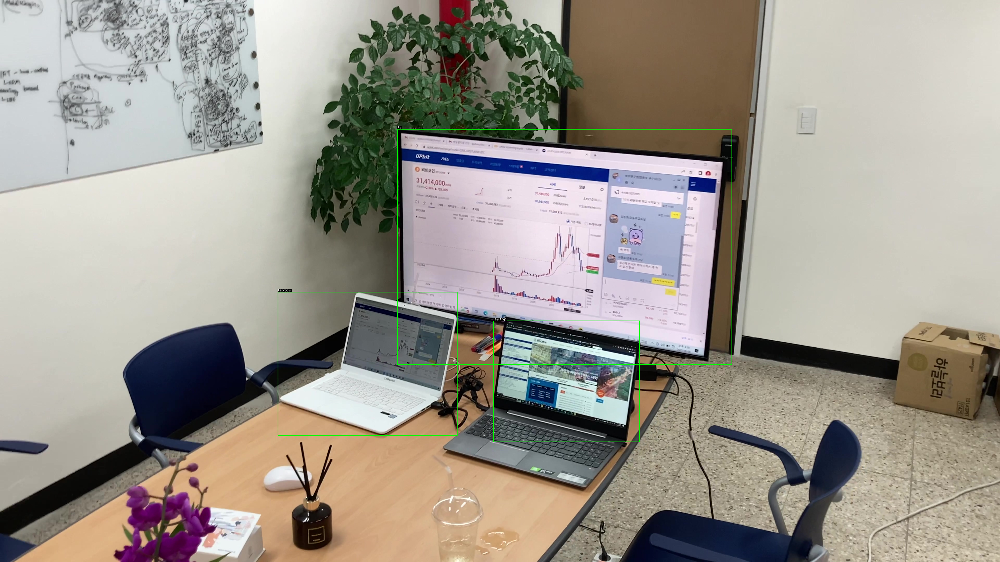

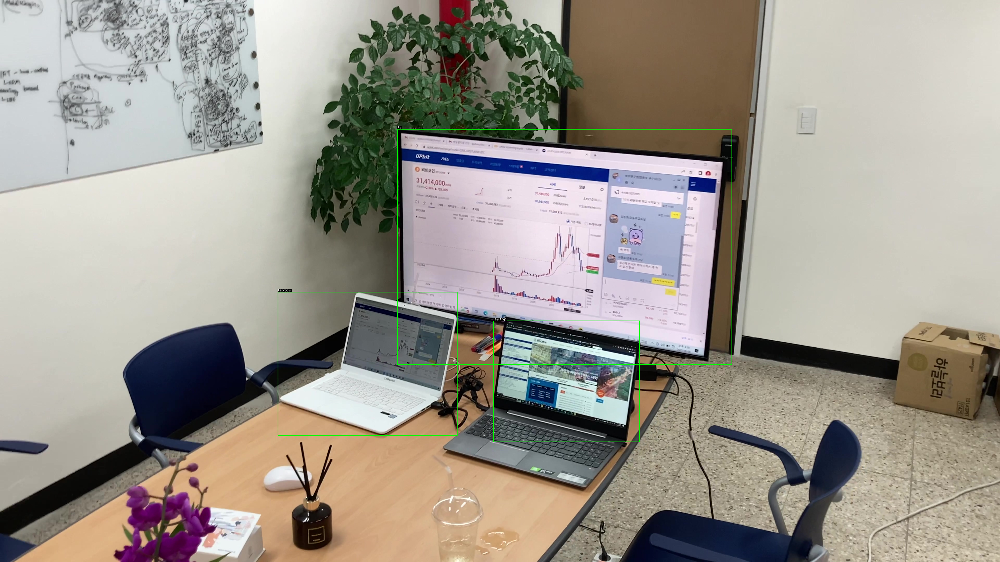

/content/PPP/lama
Run inpainting
100% 1/1 [00:05<00:00,  5.78s/it]
Finished!


In [ ]:
%cd /content/PPP
from MaskGenerator import maskGenerator

# maskGenerator.yolov5Mask(ai_model = './drive/MyDrive/MaskGenerator/yolov5mHQ', inputImg = './drive/MyDrive/MaskGenerator/example/sample1.png', outputImg='./drive/MyDrive/MaskGenerator/example/sample1_mask.png', resultImg='./drive/MyDrive/MaskGenerator/example/sample1_bbox.png', showResult=True)
maskGenerator.yolov5Mask(ai_model = './MaskGenerator/yolov5m_MonitorDetectionHQ', inputImg = './MaskGenerator/example/sample1.png', outputImg='./MaskGenerator/example/sample1_mask.png', resultImg='./MaskGenerator/example/sample1_bbox.png', showResult=True)

#테스트 수정본
#@title Change file path and start object detection and Inpainting
%cd /content/PPP/lama
import sys
import cv2
import torchvision
import base64
import matplotlib.pyplot as plt
import numpy as np

# fname = '/content/lama/data_for_prediction/sample1.png'
fname = 'sample1.png'
# fname = f'./data_for_prediction/{fname}'
# fname = f'./{fname}'
import matplotlib.pyplot as plt
print('Run inpainting')
if '.png' in fname:
  !PYTHONPATH=. TORCH_HOME=$(pwd) python3 bin/predict.py model.path=$(pwd)/big-lama indir=$(pwd)/data_for_prediction outdir=$(pwd)/result dataset.img_suffix=.png > /dev/null
  print("Finished!")
else:
  print(f'Error: unknown suffix .{fname.split(".")[-1]} use [.png]')

plt.rcParams['figure.dpi'] = 200
plt.imshow(plt.imread(f"/content/PPP/lama/result/{fname.split('.')[0]}_mask.png"))
_=plt.axis('off')
_=plt.title('inpainting result')
plt.show()

# MaskRCNN + LaMa Inpainting

In [1]:
# change python version 3.10 -> 3.7
!sudo apt-get update -y
!sudo apt-get install python3.7
!sudo update-alternatives --install /usr/bin/python3 python3 /usr/bin/python3.7 1 # Please input num 2 for changing python version
!sudo update-alternatives --config python3

Get:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease [1,581 B]
Hit:3 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  Packages [1,084 kB]
Hit:5 http://archive.ubuntu.com/ubuntu focal InRelease
Get:6 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Hit:7 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Get:8 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Hit:9 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Hit:10 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu focal InRelease
Get:11 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Hit:12 http://ppa.launchpad.net/ubuntugis/ppa/ubuntu focal InRelease
Get:13 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 Packages [3,34

In [2]:
!sudo apt install python3-pip
!sudo apt install python3.7-distutils
!python3 -m pip install ipython ipython_genutils ipykernel jupyter_console prompt_toolkit httplib2 astor
!ln -s /usr/local/lib/python3.10-/dist-packages/google /usr/local/lib/python3.7/dist-packages/google
!ln -s /usr/local/lib/python3.10-/dist-packages/google /usr/local/lib/python3.7/dist-packages/google

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  python-pip-whl python3-setuptools python3-wheel
Suggested packages:
  python-setuptools-doc
The following NEW packages will be installed:
  python-pip-whl python3-pip python3-setuptools python3-wheel
0 upgraded, 4 newly installed, 0 to remove and 15 not upgraded.
Need to get 2,389 kB of archives.
After this operation, 4,933 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal-updates/universe amd64 python-pip-whl all 20.0.2-5ubuntu1.9 [1,805 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 python3-setuptools all 45.2.0-1ubuntu0.1 [330 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal-updates/universe amd64 python3-wheel all 0.34.2-1ubuntu0.1 [23.9 kB]
Get:4 http://archive.ubuntu.com/ubuntu focal-updates/universe amd64 python3-pip all 20.0.2-5ubuntu1.9 [231 kB]
Fetched 2,389 kB in 2s (96

In [3]:
#@title Settings for ppp
%cd /content/
!git clone https://github.com/darkenergy814/PPP.git

# setting for mask_RCNN
%cd /content/PPP/Mask_RCNN
!pip3 install -r requirements.txt
!python3 setup.py install
!pip install django==3.0.7

# package for gpu ram reset
!pip install numba

# setting for LaMa
%cd /content/PPP/
print('\n> Install dependencies')
!pip install -r lama/requirements.txt --quiet
!pip install wget --quiet

!pip install torchdata==0.6.1
!pip install torchtext==0.15.2

!pip install torch==1.8.0+cu111 torchvision==0.9.0+cu111 torchaudio==0.8.0 -f https://download.pytorch.org/whl/torch_stable.html --quiet

print('\n> Changing the dir to:')
%cd /content/PPP/lama

!pip install wldhx.yadisk-direct
print('\n> Download the model')
!curl -L $(yadisk-direct https://disk.yandex.ru/d/ouP6l8VJ0HpMZg) -o big-lama.zip
!unzip big-lama.zip

print('>fixing opencv')
!pip uninstall opencv-python-headless -y --quiet
!pip install opencv-python-headless==4.6.0.66 --quiet

!pip install lightning
!pip install kornia==0.5.0
!pip install hydra-core==1.1.0
!pip install webdataset
!pip install lightning

# make directory for lama prediction
%cd /content/PPP/lama/
!mkdir data_for_prediction

# fix setting for LaMa
!pip install scikit-learn
!pip install pandas
!pip install pytorch_lightning
!pip install albumentations==0.5.2

/content
Cloning into 'PPP'...
remote: Enumerating objects: 486, done.
remote: Counting objects: 100% (361/361), done.
remote: Compressing objects: 100% (286/286), done.
remote: Total 486 (delta 89), reused 334 (delta 64), pack-reused 125
Receiving objects: 100% (486/486), 50.25 MiB | 14.24 MiB/s, done.
Resolving deltas: 100% (111/111), done.
/content/PPP/Mask_RCNN
     |████████████████████████████████| 15.7 MB 15.9 MB/s 
     |████████████████████████████████| 38.1 MB 224 kB/s 
     |████████████████████████████████| 3.3 MB 65.5 MB/s 
     |████████████████████████████████| 1.9 MB 50.5 MB/s 
     |████████████████████████████████| 11.2 MB 52.9 MB/s 
     |████████████████████████████████| 13.5 MB 60.0 MB/s 
     |████████████████████████████████| 92.6 MB 95 kB/s 
     |████████████████████████████████| 276 kB 65.1 MB/s 
     |████████████████████████████████| 61.7 MB 1.3 MB/s 
     |████████████████████████████████| 2.9 MB 80.6 MB/s 
     |████████████████████████████████| 948 kB 72.

In [4]:
%cd /content/PPP
from MaskGenerator import maskGenerator

maskGenerator.mrcnnMask(inputImg='/content/PPP/MaskGenerator/example/sample8.png', outputImg='/content/PPP/MaskGenerator/example/sample8_mask.png')

!cp -r '/content/PPP/MaskGenerator/example/sample8.png' '/content/PPP/lama/data_for_prediction'
!cp -r '/content/PPP/MaskGenerator/example/sample8_mask.png' '/content/PPP/lama/data_for_prediction'

from numba import cuda
device = cuda.get_current_device()
device.reset()

/content/PPP


/content/PPP/Mask_RCNN/mrcnn/model.py:2364: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if os.name is 'nt':


... done downloading pretrained model!

Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE

Instructions for updating:
Use fn_output_signature instead


[[[211 207 196]
  [211 207 196]
  [212 208 197]
  ...
  [246 244 232]
  [246 244 232]
  [246 244 232]]

 [[211 207 196]
  [211 207 196]
  [212 208 197]
  ...
  [246 244 232]
  [246 244 232]
  [246 244 232]]

 [[212 208 197]
  [212 208 197]
  [212 208 197]
  ...
  [246 244 232]
  [246 244 232]
  [246 244 232]]

 ...

 [[ 55  48  38]
  [ 56  49  39]
  [ 55  48  38]
  ...
  [ 84  79  73]
  [ 83  78  72]
  [ 82  77  71]]

 [[ 55  48  38]
  [ 54  47  37]
  [ 56  49  39]
  ...
  [ 84  79  73]
  [ 83  78  72]
  [ 83  78  72]]

 [[ 55  48  38]
  [ 51  44  34]
  [ 57  50  40]
  ...
  [ 83  78  72]
  [ 83  78  72]
  [ 83  78  72]]]
0 63
1 63
2 67
3 57
4 65
5 42
6 1
7 57
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ..

In [ ]:
# !rm -r /usr/local/lib/python3.7/dist-packages/protobuf-3.19.6-py3.7-nspkg.pth

/content/PPP/lama
Run inpainting
Error processing line 1 of /usr/local/lib/python3.7/dist-packages/protobuf-3.19.6-py3.7-nspkg.pth:

  Traceback (most recent call last):
    File "/usr/lib/python3.7/site.py", line 174, in addpackage
      exec(line)
    File "<string>", line 1, in <module>
    File "<frozen importlib._bootstrap>", line 580, in module_from_spec
  AttributeError: 'NoneType' object has no attribute 'loader'

Remainder of file ignored
100% 1/1 [00:13<00:00, 13.16s/it]
Finished!


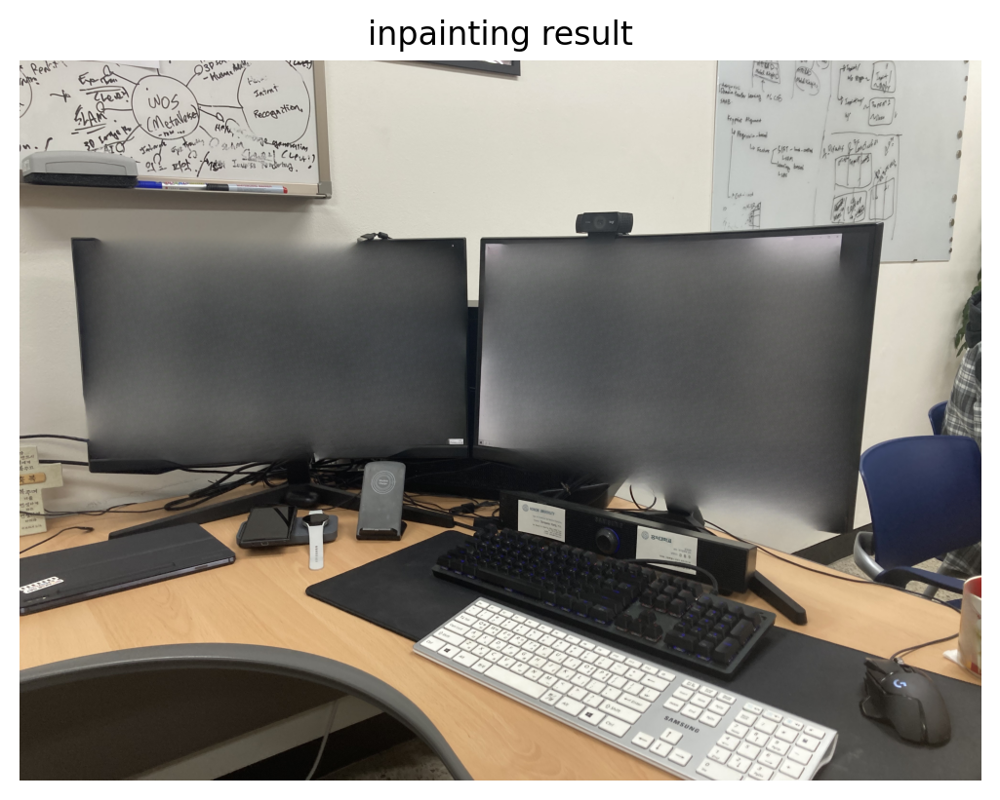

In [6]:
#테스트 수정본
#@title Change file path and start Inpainting
%cd /content/PPP/lama
import sys
import cv2
import torchvision
import base64
import matplotlib.pyplot as plt
import numpy as np

fname = 'sample8.png'

import matplotlib.pyplot as plt
print('Run inpainting')
if '.png' in fname:
  !PYTHONPATH=. TORCH_HOME=$(pwd) python3 bin/predict.py model.path=$(pwd)/big-lama indir=$(pwd)/data_for_prediction outdir=$(pwd)/result dataset.img_suffix=.png > /dev/null
  print("Finished!")
else:
  print(f'Error: unknown suffix .{fname.split(".")[-1]} use [.png]')

plt.rcParams['figure.dpi'] = 200
plt.imshow(plt.imread(f"/content/PPP/lama/result/{fname.split('.')[0]}_mask.png"))
_=plt.axis('off')
_=plt.title('inpainting result')
plt.show()

# Yolov5 + LaMa Inpainting(dev version)

This block is for yolov5 obejcet detection and LaMa inpainting



In [ ]:
%cd /content/
!git clone https://github.com/darkenergy814/PPP.git

%cd /content/PPP/yolov5/
!pip install -r requirements.txt  # install yolov5 requirements

/content
Cloning into 'PPP'...
remote: Enumerating objects: 423, done.
remote: Counting objects: 100% (298/298), done.
remote: Compressing objects: 100% (246/246), done.
remote: Total 423 (delta 44), reused 293 (delta 41), pack-reused 125
Receiving objects: 100% (423/423), 50.21 MiB | 12.93 MiB/s, done.
Resolving deltas: 100% (66/66), done.
/content/PPP/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 30.0 MB/s eta 0:00:00


In [ ]:
#@title Download ultralytics package for yolov5
%cd /content/PPP
!pip install ultralytics

/content/PPP
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 626.9/626.9 kB 22.6 MB/s eta 0:00:00


In [ ]:
#@title Download .pt file for yolov5
%cd /content/PPP/MaskGenerator/
!gdown https://drive.google.com/uc?id=1TKUotZmksKbZDwQckLBJXkcLsMkRiYmG

/content/PPP/MaskGenerator
Downloading...
From: https://drive.google.com/uc?id=1TKUotZmksKbZDwQckLBJXkcLsMkRiYmG
To: /content/PPP/MaskGenerator/yolov5m_MonitorDetectionHQ.pt
100% 42.1M/42.1M [00:00<00:00, 217MB/s]


In [ ]:
#@title Generate mask for Inpainting { display-mode: "both" }
%cd /content/PPP
from MaskGenerator import maskGenerator

# maskGenerator.yolov5Mask(ai_model = './drive/MyDrive/MaskGenerator/yolov5mHQ', inputImg = './drive/MyDrive/MaskGenerator/example/sample1.png', outputImg='./drive/MyDrive/MaskGenerator/example/sample1_mask.png', resultImg='./drive/MyDrive/MaskGenerator/example/sample1_bbox.png', showResult=True)
maskGenerator.yolov5Mask(ai_model = './MaskGenerator/yolov5m_MonitorDetectionHQ', inputImg = './MaskGenerator/example/sample1.png', outputImg='./MaskGenerator/example/sample1_mask.png', resultImg='./MaskGenerator/example/sample1_bbox.png', showResult=True)

In [ ]:
# @title Run this sell to set everything up for LaMa Inpainting
print('\n> Install dependencies')
# !pip install torch==2.0.0 torchvision==0.9.0 torchaudio==0.8.0 torchtext==0.9
!pip install -r lama/requirements.txt --quiet
!pip install wget --quiet

!pip install torchdata==0.6.1
!pip install torchtext==0.15.2

# !pip install torch==1.8.0+cu111 torchvision==0.9.0+cu111 torchaudio==0.8.0 -f https://download.pytorch.org/whl/torch_stable.html --quiet
!pip install torch==2.0.0+cu118 torchvision==0.15.1+cu118 torchaudio==2.0.1 --index-url https://download.pytorch.org/whl/cu118

print('\n> Changing the dir to:')
%cd /content/PPP/lama

!pip install wldhx.yadisk-direct
print('\n> Download the model')
!curl -L $(yadisk-direct https://disk.yandex.ru/d/ouP6l8VJ0HpMZg) -o big-lama.zip
!unzip big-lama.zip

print('>fixing opencv')
!pip uninstall opencv-python-headless -y --quiet
!pip install opencv-python-headless==4.6.0.66 --quiet

!pip install lightning
!pip install kornia==0.5.0
!pip install hydra-core==1.1.0
!pip install webdataset
!pip install lightning

# make directory for lama prediction
%cd /content/PPP/lama/
!mkdir data_for_prediction

!cp -r '/content/PPP/MaskGenerator/example/sample1.png' '/content/PPP/lama/data_for_prediction'
!cp -r '/content/PPP/MaskGenerator/example/sample1_mask.png' '/content/PPP/lama/data_for_prediction'


> Install dependencies
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.6/144.6 kB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.9/841.9 kB 45.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 271.5/271.5 kB 28.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.9/51.9 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.7/74.7 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.4/112.4 kB 15.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.9/176.9 kB 23.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 GB 348.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 108.5 MB/s e


> Changing the dir to:
/content/PPP/lama

> Download the model
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
100  363M    0  363M    0     0  9277k      0 --:--:--  0:00:40 --:--:-- 10.6M
Archive:  big-lama.zip
  inflating: big-lama/config.yaml    
  inflating: big-lama/models/best.ckpt  
>fixing opencv
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.3/48.3 MB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 58.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.7/70.7 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.7/65.7 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 596.7/596.7 kB 41.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━

In [ ]:
#테스트 수정본
#@title Change file path and start Inpainting
%cd /content/PPP/lama
import sys
import cv2
import torchvision
import base64
import matplotlib.pyplot as plt
import numpy as np

# fname = '/content/lama/data_for_prediction/sample1.png'
fname = 'sample1.png'
# fname = f'./data_for_prediction/{fname}'
# fname = f'./{fname}'
import matplotlib.pyplot as plt
print('Run inpainting')
if '.png' in fname:
  !PYTHONPATH=. TORCH_HOME=$(pwd) python3 bin/predict.py model.path=$(pwd)/big-lama indir=$(pwd)/data_for_prediction outdir=$(pwd)/result dataset.img_suffix=.png > /dev/null
  print("Finished!")
else:
  print(f'Error: unknown suffix .{fname.split(".")[-1]} use [.png]')

plt.rcParams['figure.dpi'] = 200
plt.imshow(plt.imread(f"/content/PPP/lama/result/{fname.split('.')[0]}_mask.png"))
_=plt.axis('off')
_=plt.title('inpainting result')
plt.show()

/content/PPP/lama
Run inpainting
100% 1/1 [00:06<00:00,  6.14s/it]
Finished!
